---

<h2 align="center"><img src="https://www.unir.net/wp-content/uploads/2019/11/Unir_2021_logo.svg" alt="Logo UNIR" width="200"></h2>

<h2 align="center">UNIR, MÁSTER UNIVERSITARIO EN INTELIGENCIA ARTIFICIAL</h2>

<h3 align="center">TRABAJO FIN DE ESTUDIOS</h3>

<h1 align="center">
  <BR>
  Red Proyectum:<BR>Anticipando la Rotación Voluntaria de Empleados para una Gestión Eficaz
</h1>

<BR>
<h2>

  <table style="border-collapse: collapse; width: 100%;">
    <tr>
      <td>Trabajo fin de estudio presentado por:</td>
      <td>
        Juan José Serrano Rojas<br>
        Martín Pereira Cubedo<br>
        Tania Durán Vicente
      </td>
    </tr>
    <tr>
      <td>Tipo de trabajo:</td>
      <td>Red Proyectum</td>
    </tr>
    <tr>
      <td>Director/a:</td>
      <td>Joaquín Gaspar Medina Arco</td>
    </tr>
    <tr>
      <td>Fecha:</td>
      <td>07/2025</td>
    </tr>
  </table>
</h2>

---

Notebook para generar datos del EDA para incluir en la memoria del TFM

# **1. Exploración inicial de datos**

In [2]:
#Importing the basic librarires

import os
import math
import scipy
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import randint
from scipy.stats import loguniform
from IPython.display import display

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10,6]

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', 50)



## Cargamos el dataset

In [7]:
#Cargando el dataset

df = pd.read_csv('./DATASET/WA_Fn-UseC_-HR-Employee-Attrition.csv')
df.drop(['EmployeeCount', 'Over18', 'StandardHours', 'EmployeeNumber'], axis=1, inplace=True)

target = 'Attrition'
labels = ['Yes','No']
features = [i for i in df.columns.values if i not in [target]]

original_df = df.copy(deep=True)
display(df.head())

print(f'El dataset consiste en  {df.shape[1]} características y {df.shape[0]} registros.')

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2


El dataset consiste en  31 características y 1470 registros.


In [8]:
#Primera inspección

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

In [9]:
#Revisando valores únicos

df.nunique().sort_values()

Attrition                      2
PerformanceRating              2
OverTime                       2
Gender                         2
MaritalStatus                  3
BusinessTravel                 3
Department                     3
RelationshipSatisfaction       4
JobSatisfaction                4
JobInvolvement                 4
StockOptionLevel               4
WorkLifeBalance                4
EnvironmentSatisfaction        4
JobLevel                       5
Education                      5
EducationField                 6
TrainingTimesLastYear          7
JobRole                        9
NumCompaniesWorked            10
PercentSalaryHike             15
YearsSinceLastPromotion       16
YearsWithCurrManager          18
YearsInCurrentRole            19
DistanceFromHome              29
YearsAtCompany                37
TotalWorkingYears             40
Age                           43
HourlyRate                    71
DailyRate                    886
MonthlyIncome               1349
MonthlyRat

In [11]:
#Chequeando el número de valores únicos y categorizando features. 

nu = df[features].nunique().sort_values()
nf = []; cf = []; nnf = 0; ncf = 0; #numerical & categorical features

for i in range(df[features].shape[1]):
    if nu.values[i]<=9:cf.append(nu.index[i])
    else: nf.append(nu.index[i])


print(f'El dataset tiene {len(nf)} características numéricas y {len(cf)} categóricas.'.format(len(cf)))

El dataset tiene 13 características numéricas y 17 categóricas.


In [15]:
print(f'caracterísiticas categóficas{cf}')
print('-'*70)
print(f'caracterísiticas numéricas{nf}')

caracterísiticas categóficas['PerformanceRating', 'OverTime', 'Gender', 'MaritalStatus', 'BusinessTravel', 'Department', 'RelationshipSatisfaction', 'JobSatisfaction', 'JobInvolvement', 'StockOptionLevel', 'WorkLifeBalance', 'EnvironmentSatisfaction', 'JobLevel', 'Education', 'EducationField', 'TrainingTimesLastYear', 'JobRole']
----------------------------------------------------------------------
caracterísiticas numéricas['NumCompaniesWorked', 'PercentSalaryHike', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'YearsInCurrentRole', 'DistanceFromHome', 'YearsAtCompany', 'TotalWorkingYears', 'Age', 'HourlyRate', 'DailyRate', 'MonthlyIncome', 'MonthlyRate']


In [16]:
#Revisando estadísitcas 

display(df.describe())

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


# **1. Estudio estadístico descriptivo (EDA)**

#### Revisamos balanceo de la clase dependiente

            Target Variable Distribution           


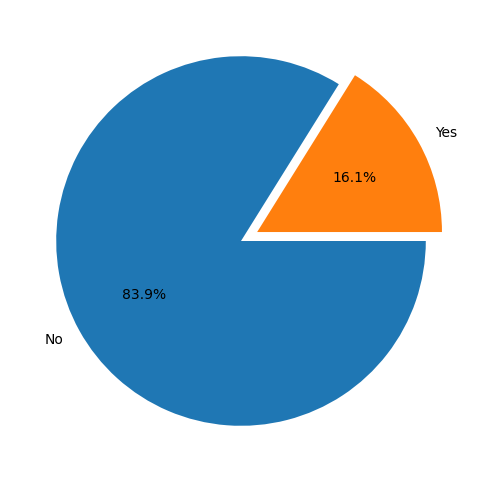

In [17]:
import matplotlib.pyplot as plt


MAP={}
for e, i in enumerate(df[target].unique()):
    MAP[i]=labels[e]

df1 = df.copy()
df1[target]=df1[target].map(MAP)
explode=np.zeros(len(labels))
explode[-1]=0.1
print('\033[1mTarget Variable Distribution'.center(55))
plt.pie(df1[target].value_counts(), labels=df1[target].value_counts().index, counterclock=False, shadow=False,
        explode=explode, autopct='%1.1f%%', radius=1, startangle=0)
plt.show()


#### Revisamos distribución de las variables categóricas en función de la variable objetivo

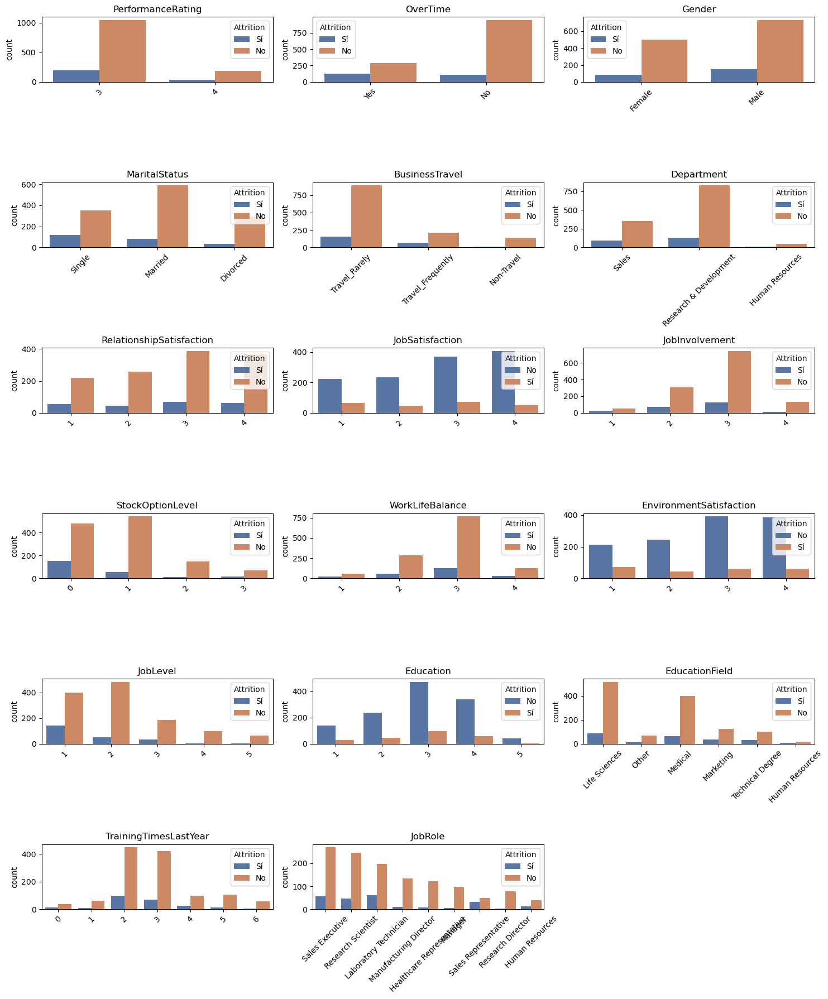

In [18]:

n = 3  # Número de columnas por fila en el subplot

datos = df.copy()
datos[target] = datos[target].replace({'Yes': 'Sí'})

plt.figure(figsize=[15, 3 * math.ceil(len(cf) / n)])
palette = sns.color_palette("deep", len(df[target].unique()))

cfsinatt = cf.copy()
#cfsinatt.remove('Attrition')

for i in range(len(cfsinatt)):
    plt.subplot(math.ceil(len(cfsinatt) / n), n, i + 1)
    sns.countplot(data=datos, x=cfsinatt[i], hue=target, palette=palette)
    plt.title(f'{cfsinatt[i]}')  # Añade el título con el nombre de la variable
    plt.xticks(rotation=45)
    plt.xlabel('')

plt.tight_layout()
plt.show()


#### Distribución de variables numéricas y outliers

                                     Features Distribution                                      


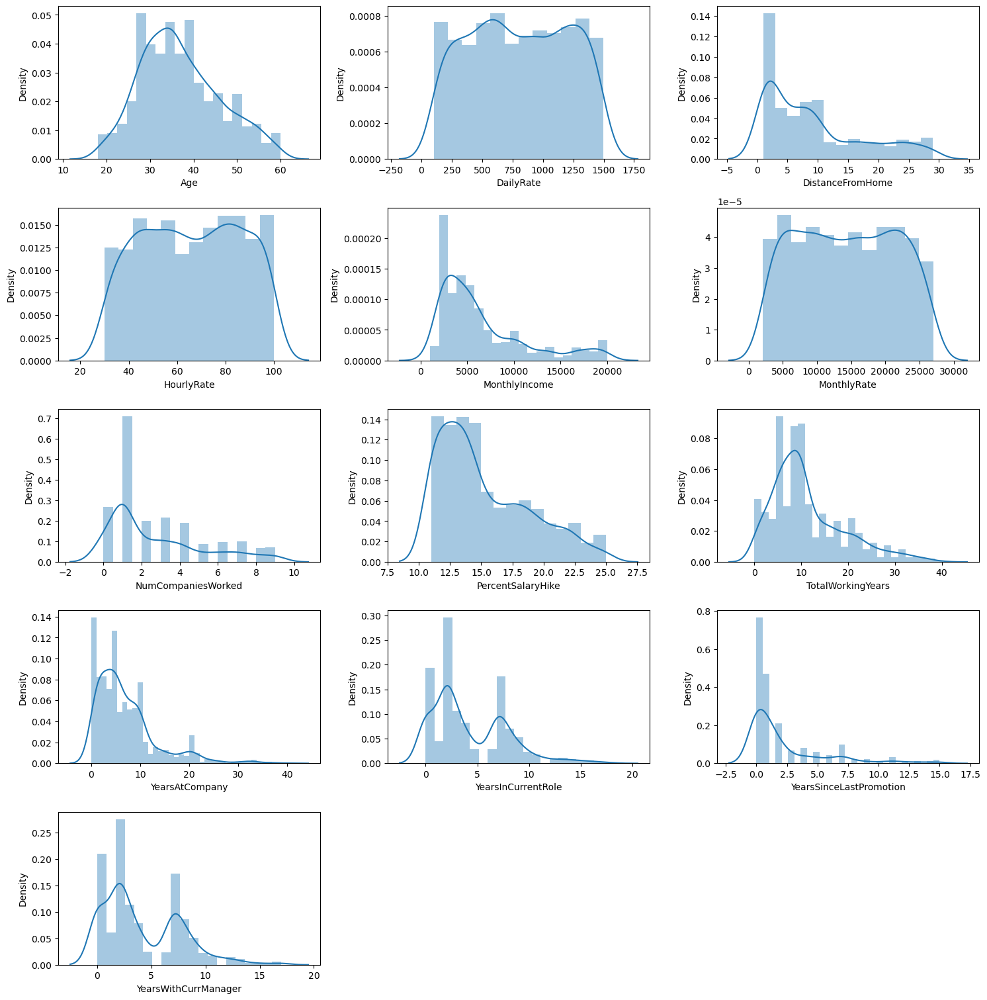

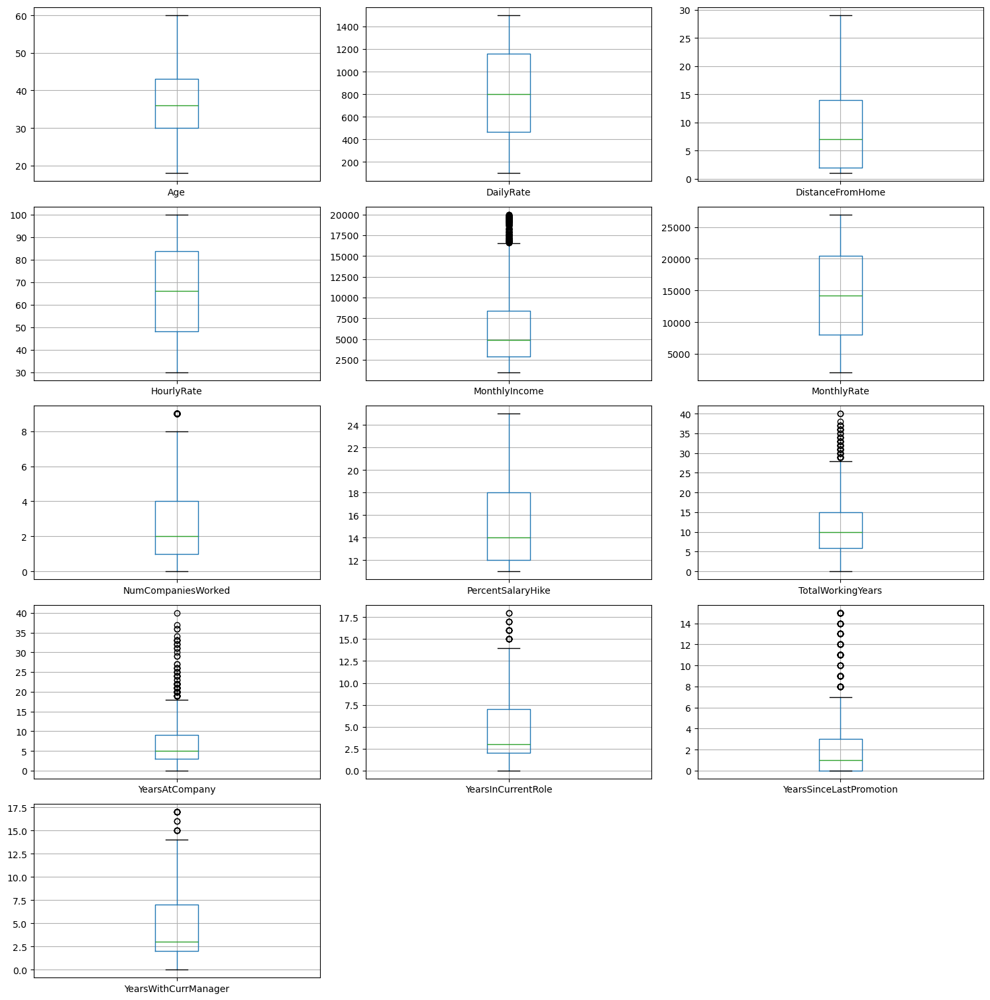

In [ ]:


nf = [i for i in features if i not in cf]

plt.figure(figsize=[15,3*math.ceil(len(features)/3)])
for c in range(len(nf)):
    plt.subplot(math.ceil(len(features)/3),3,c+1)
    sns.distplot(df[nf[c]])
plt.tight_layout()
plt.show()

plt.figure(figsize=[15,3*math.ceil(len(features)/3)])
for c in range(len(nf)):
    plt.subplot(math.ceil(len(features)/3),3,c+1)
    df.boxplot(nf[c])
plt.tight_layout()
plt.show()

#### Distribución de variables numéricas en función de variable objetivo

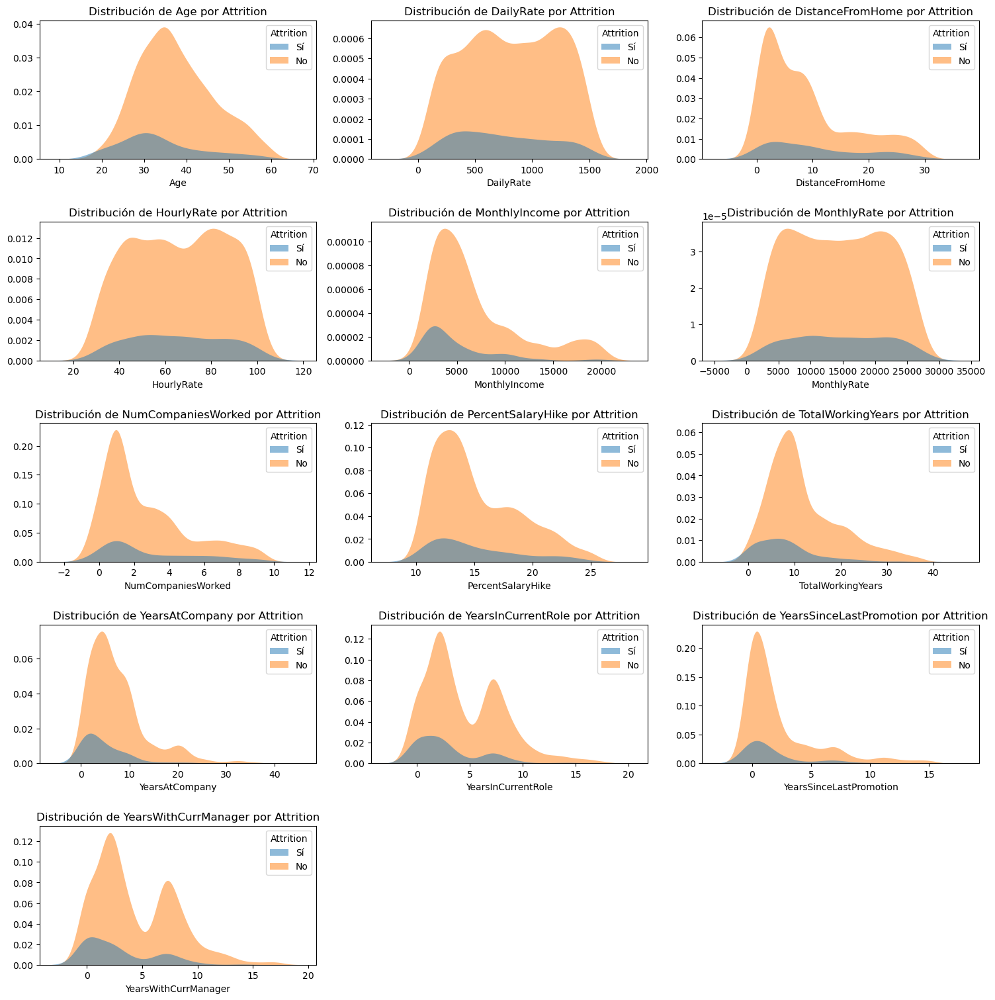

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
import math

# Suponiendo que 'df' es tu DataFrame y 'features' es una lista de características
nf = [i for i in features if i not in cf]

plt.figure(figsize=[15, 3 * math.ceil(len(features) / 3)])


for c in range(len(nf)):
    plt.subplot(math.ceil(len(features) / 3), 3, c + 1)
    
    # Verifica si la columna es numérica antes de intentar trazar el KDE
    if datos[nf[c]].dtype in ['int64', 'float64']:  # Asegúrate de ajustar según tus tipos de datos
        sns.kdeplot(data=datos, x=nf[c], hue=target, fill=True, alpha=0.5, linewidth=0)
    else:
        sns.countplot(data=datos, x=nf[c], hue=target)  # Por ejemplo, si es categórico
    
    plt.title(f'Distribución de {nf[c]} por {target}')
    plt.ylabel('')
    plt.xlabel(nf[c])  # Agrega etiqueta de eje x si es necesario

 

plt.tight_layout()
plt.show()


#### Distribución por pares de variables. 

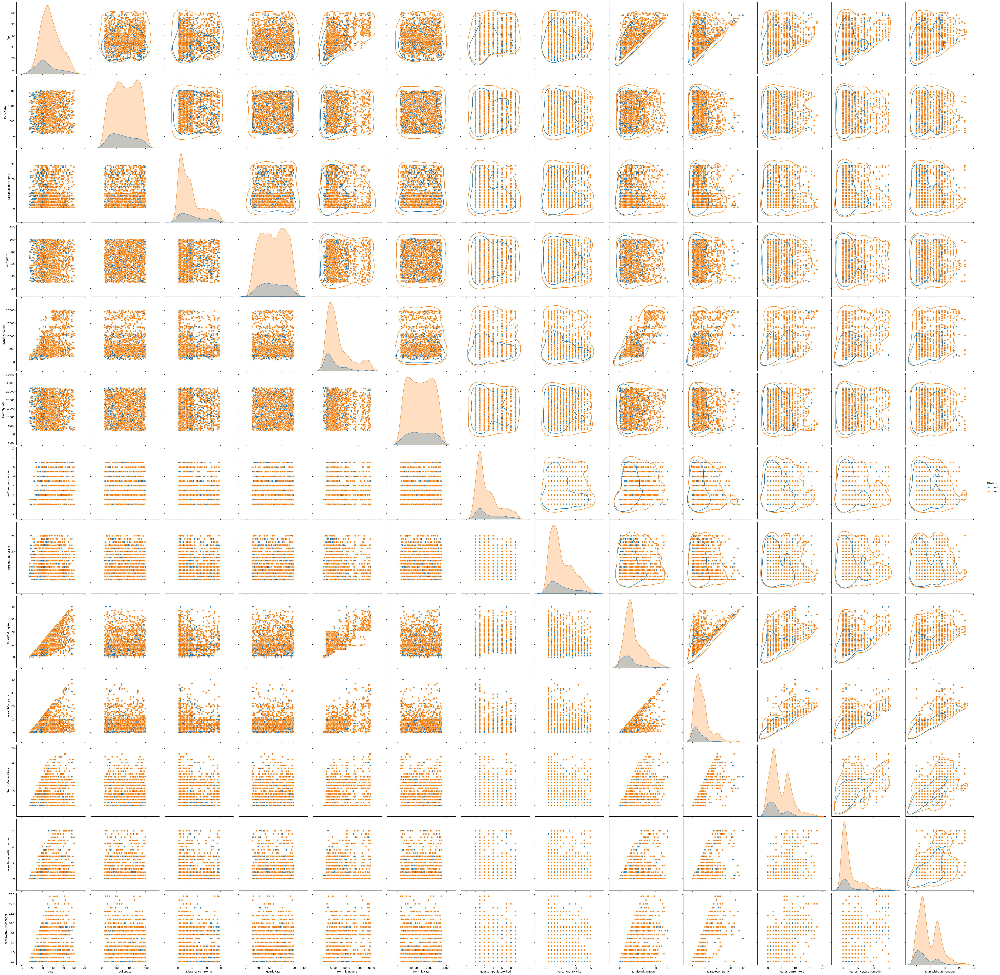

In [ ]:


nfmas = nf.copy()
nfmas.append(target)

g=sns.pairplot(df[nfmas], hue=target, size=4)
g.map_upper(sns.kdeplot, levels=1, color=".2")
plt.show()


### Estudiamos correlaciones entre: 
1.- Variables numéricas entre sí. 
2.- Variables categóricas entre sí. (chi-cuadrado)


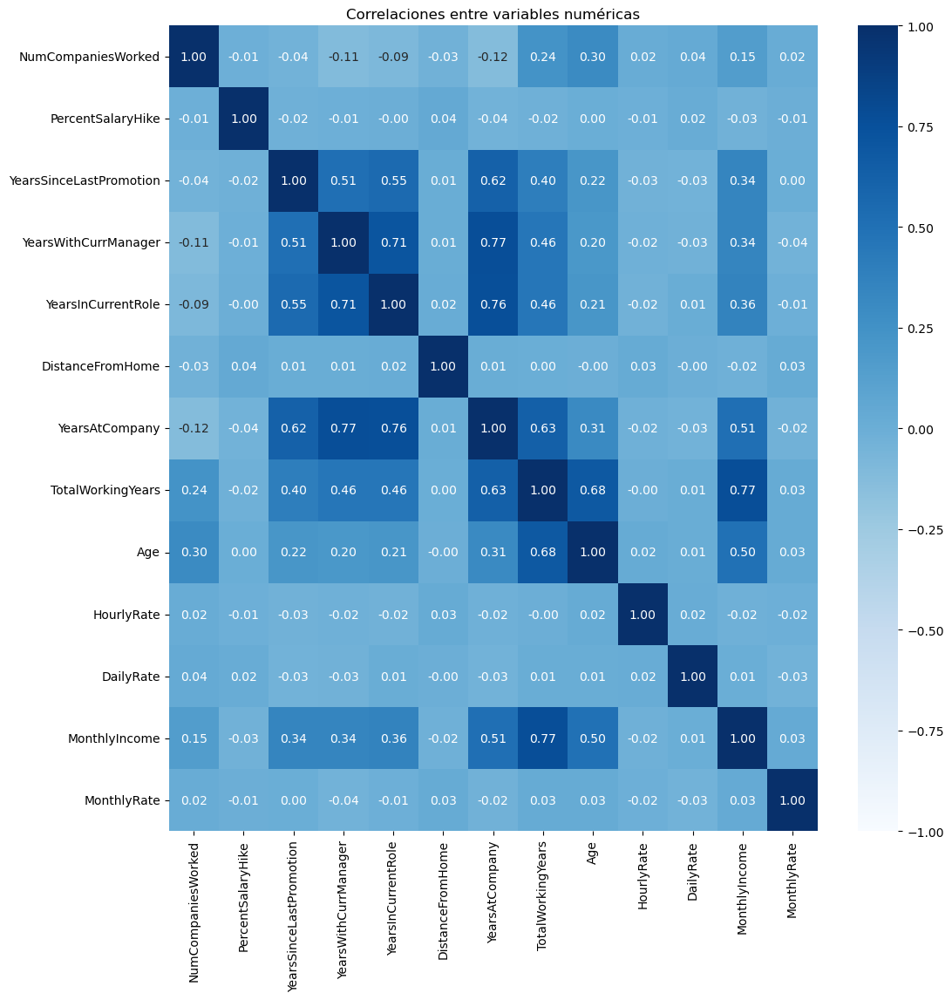

In [23]:


# Supongamos que nf es tu lista de variables numéricas
corr = df[nf].corr()

# Creamos una máscara para la mitad inferior
mask = np.tril(np.ones_like(corr, dtype=bool))

plt.figure(figsize=[12,12])
plt.title('Correlaciones entre variables numéricas')

sns.heatmap(
    corr, 
    #mask=mask,             # Oculta la mitad inferior
    vmin=-1, vmax=1, 
    center=0, 
    annot=True, 
    fmt=".2f",             # Solo dos decimales
    cmap='Blues'
)

plt.show()


### Relaciones entre las variables categóricas (mediante chi-cuadrado)

In [22]:

from scipy.stats import chi2_contingency

cf_rels = cf
cf_rels.append(target)

# Función para calcular chi-cuadrado y valor p, y evaluar la hipótesis de independencia
def chi_square_test(df, col1, col2, alpha=0.05):
    contingency_table = pd.crosstab(df[col1], df[col2])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    
    # Evaluar la significancia del valor p
    if p > alpha:
        independence = "Independencia"
    else:
        independence = "Correlacion"
    
    return chi2, p, independence

# Calcular chi-cuadrado y valor p para todas las combinaciones de columnas en cf
results = {}
for i, col1 in enumerate(cf_rels):
    for j, col2 in enumerate(cf[i+1:], start=i+1):
        chi2, p, independence = chi_square_test(df, col1, col2)
        results[f'{col1} vs {col2}'] = {'Chi-square': chi2, 'p-value': p, 'Independencia': independence}

# Imprimir resultados
for key, value in results.items():
    print(f'{key}: Chi-square = {value["Chi-square"]}, p-value = {value["p-value"]}, {value["Independencia"]}\n')
    #print(f'{key}:  {value["Independencia"]}')


PerformanceRating vs OverTime: Chi-square = 0.007612865068607728, p-value = 0.930471418406982, Independencia

PerformanceRating vs Gender: Chi-square = 0.20936335116523896, p-value = 0.6472668610261814, Independencia

PerformanceRating vs MaritalStatus: Chi-square = 0.19579810238296289, p-value = 0.9067404335003312, Independencia

PerformanceRating vs BusinessTravel: Chi-square = 1.063238051547695, p-value = 0.5876527740844302, Independencia

PerformanceRating vs Department: Chi-square = 1.5895356216820289, p-value = 0.4516860993634647, Independencia

PerformanceRating vs RelationshipSatisfaction: Chi-square = 1.9729548753696, p-value = 0.5780389543631816, Independencia

PerformanceRating vs JobSatisfaction: Chi-square = 4.014325782197208, p-value = 0.25992135368097197, Independencia

PerformanceRating vs JobInvolvement: Chi-square = 1.96403793317313, p-value = 0.5799042156151673, Independencia

PerformanceRating vs StockOptionLevel: Chi-square = 1.9308680298288388, p-value = 0.5868785